In [1]:
import torch

print(torch.__version__)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

2.13.0+cu130
True
NVIDIA GeForce RTX 3070 Laptop GPU


In [2]:
from ultralytics import YOLO

model = YOLO("yolo26n.pt")

results = model.train(
    data="/home/jgaldeano/tfm/data/datasets/yolo/dataset.yaml",
    epochs=15,
    imgsz=960,
    batch = 8,
    patience = 30,
    optimizer = 'auto',
    cache = False,
    multi_scale = False,
    device=0,
    project = "/home/jgaldeano/tfm/results/yolo",
    name = "yolo26n_v1",
    
    workers = 2,
    
    seed = 0,
    
    # Data Augm
    
    fliplr=0.5,
    degrees=3,
    translate=0.1
)

Ultralytics 8.4.100 🚀 Python-3.10.12 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 8192MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/jgaldeano/tfm/data/datasets/yolo/dataset.yaml, degrees=3, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo26m_v1-5, nbs=64, nms=False, opse

In [ ]:
# para continuar el entrenamiento

model = YOLO("/home/jgaldeano/tfm/results/yolo/yolo26n_v1/weights/last.pt")

model.train(
    resume=True
)

# TESTING


RESULTADOS DEL ENTRENAMIENTO



,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,46.1752,1.63300,9.12026,0.00189,0.64747,0.75245,0.73746,0.43516,1.28723,6.93925,0.00221,0.000663,0.000663,0.000663
1,2,88.9280,1.48674,4.36168,0.00170,0.80114,0.81800,0.88162,0.53895,1.35120,3.14927,0.00235,0.001242,0.001242,0.001242
2,3,133.6150,1.40692,2.18031,0.00155,0.81680,0.84634,0.89521,0.57986,1.23026,1.88987,0.00210,0.001733,0.001733,0.001733
3,4,179.5850,1.35346,1.43631,0.00151,0.85031,0.82820,0.90204,0.56700,1.31378,1.25222,0.00236,0.001604,0.001604,0.001604
4,5,228.4200,1.33547,1.01362,0.00147,0.85603,0.84360,0.91494,0.58825,1.27330,1.00101,0.00227,0.001472,0.001472,0.001472
5,6,276.9420,1.23602,0.94785,0.00151,0.83696,0.82878,0.89621,0.54189,1.40179,0.95818,0.00254,0.001340,0.001340,0.001340
6,7,324.5550,1.27275,0.73971,0.00157,0.84800,0.83519,0.90766,0.57482,1.31440,0.81081,0.00235,0.001208,0.001208,0.001208
7,8,374.6900,1.19859,0.65596,0.00142,0.85387,0.83170,0.91620,0.58584,1.27774,0.73756,0.00227,0.001076,0.001076,0.001076
8,9,418.3630,1.16593,0.59329,0.00139,0.86322,0.86106,0.93304,0.62755,1.19330,0.66420,0.00208,0.000944,0.000944,0.000944
9,10,460.6120,1.12797,0.55192,0.00131,0.86915,0.88063,0.93097,0.60499,1.24629,0.68166,0.00220,0.000812,0.000812,0.000812


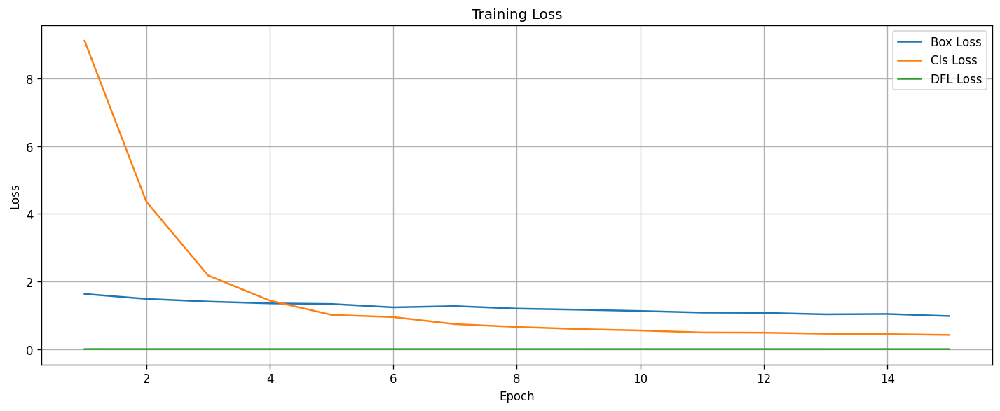

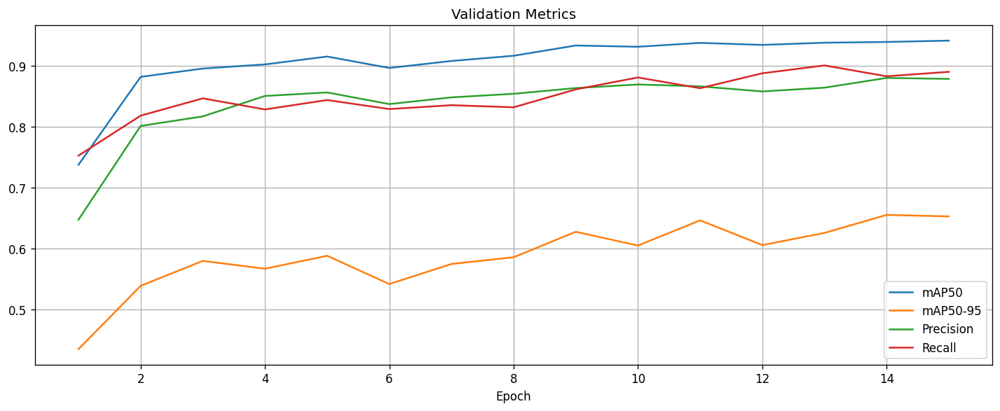

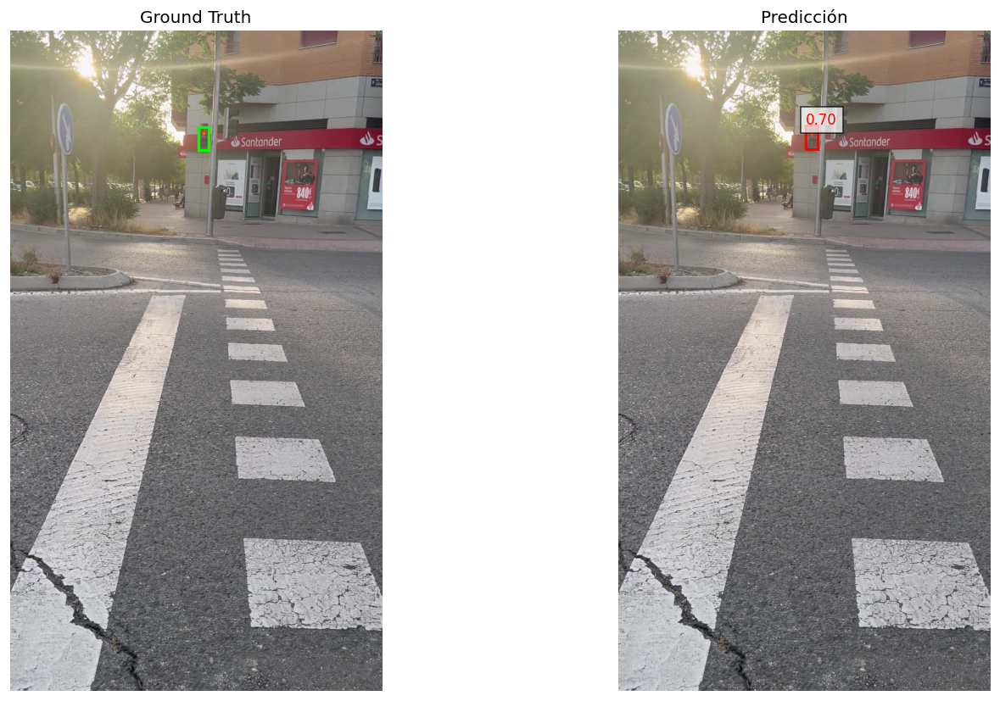

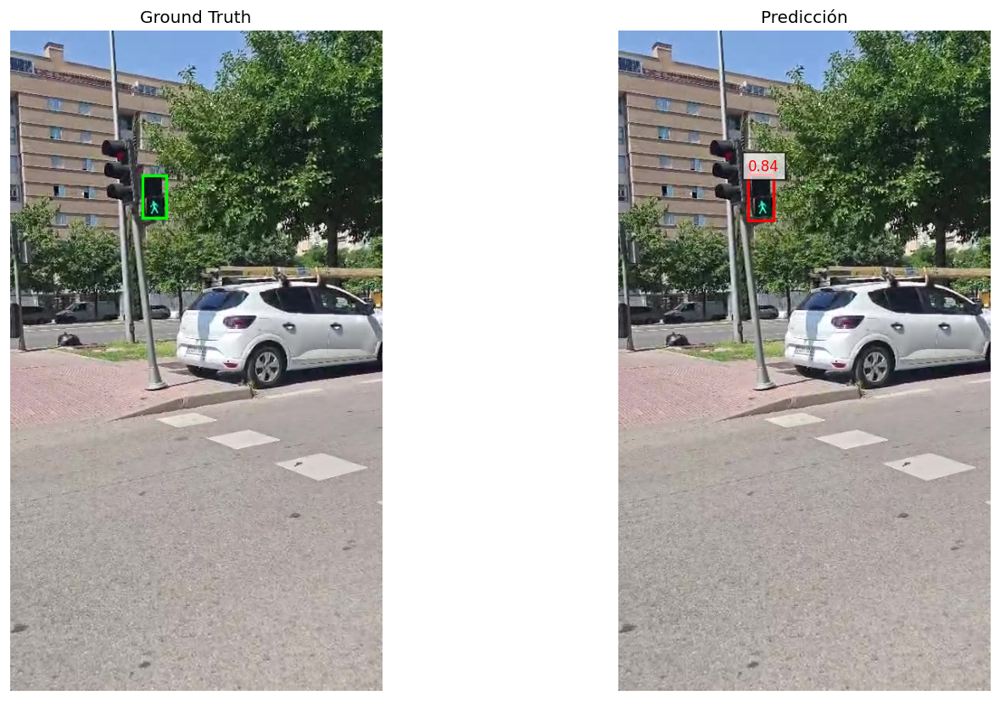

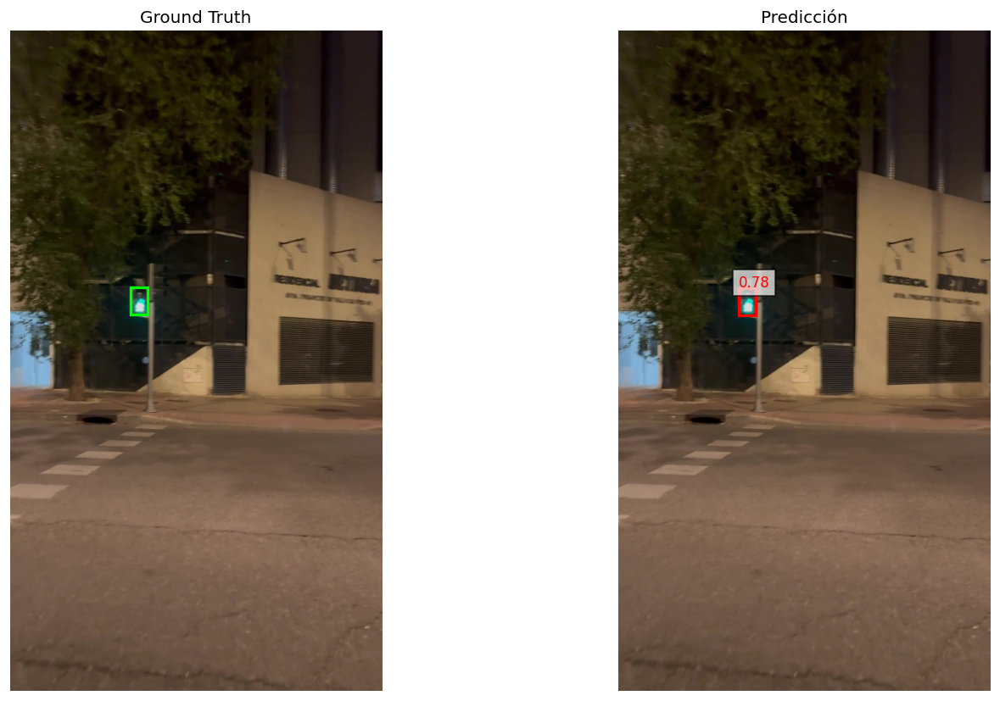

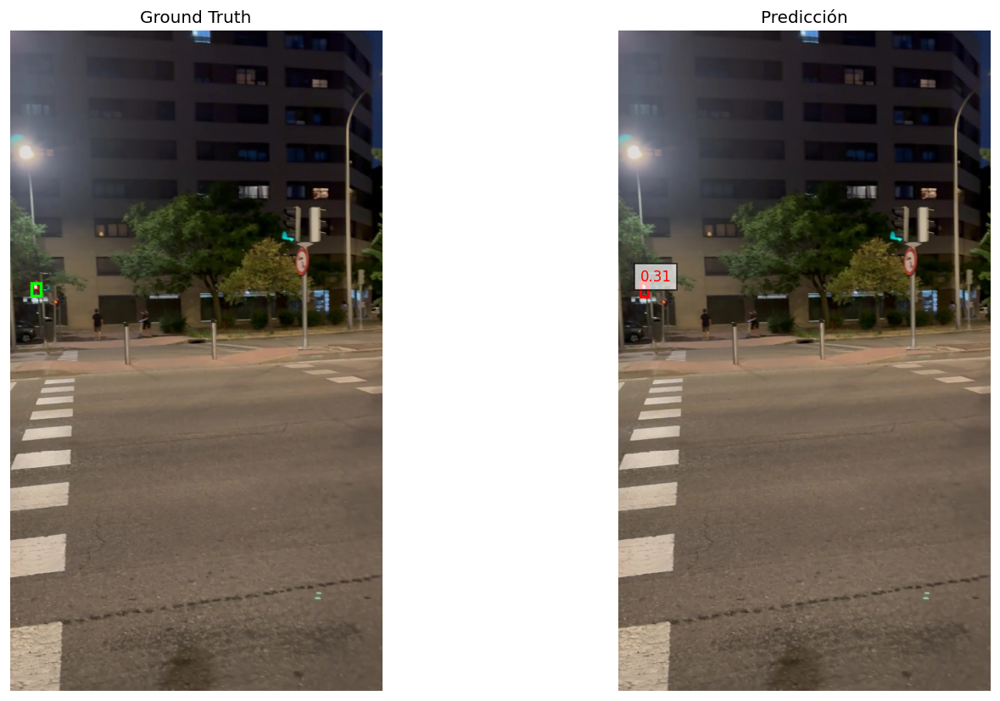

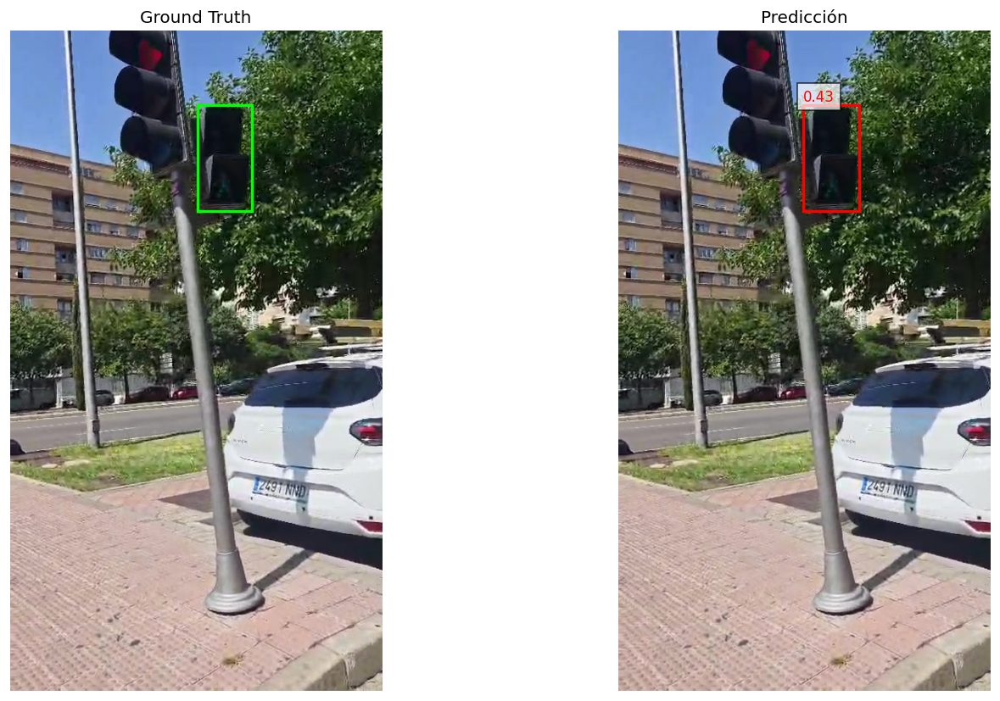

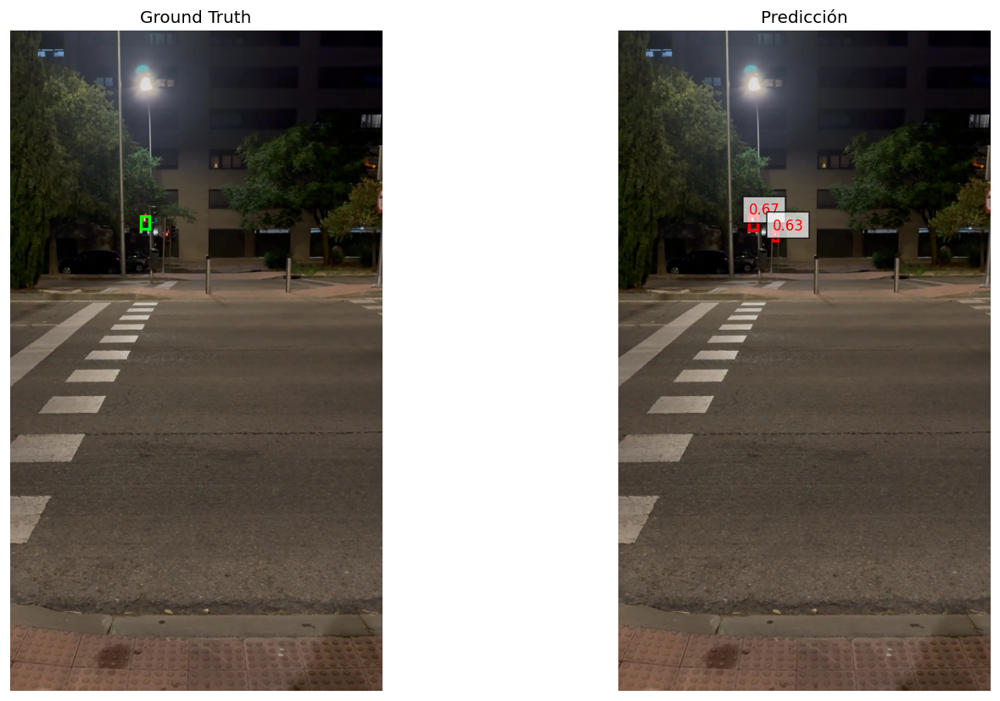

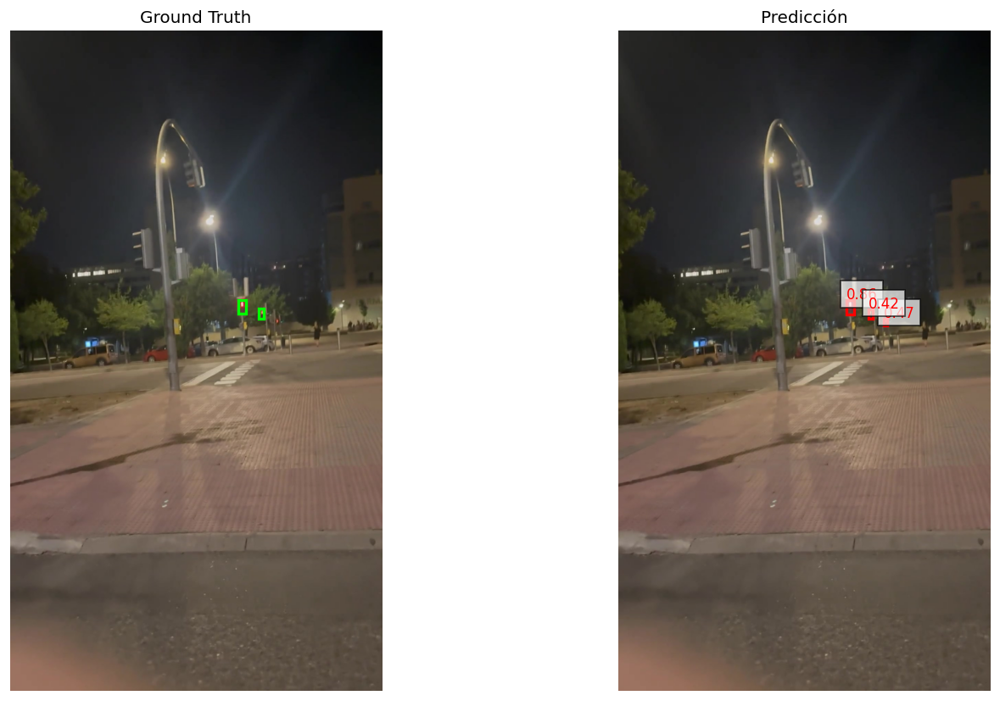

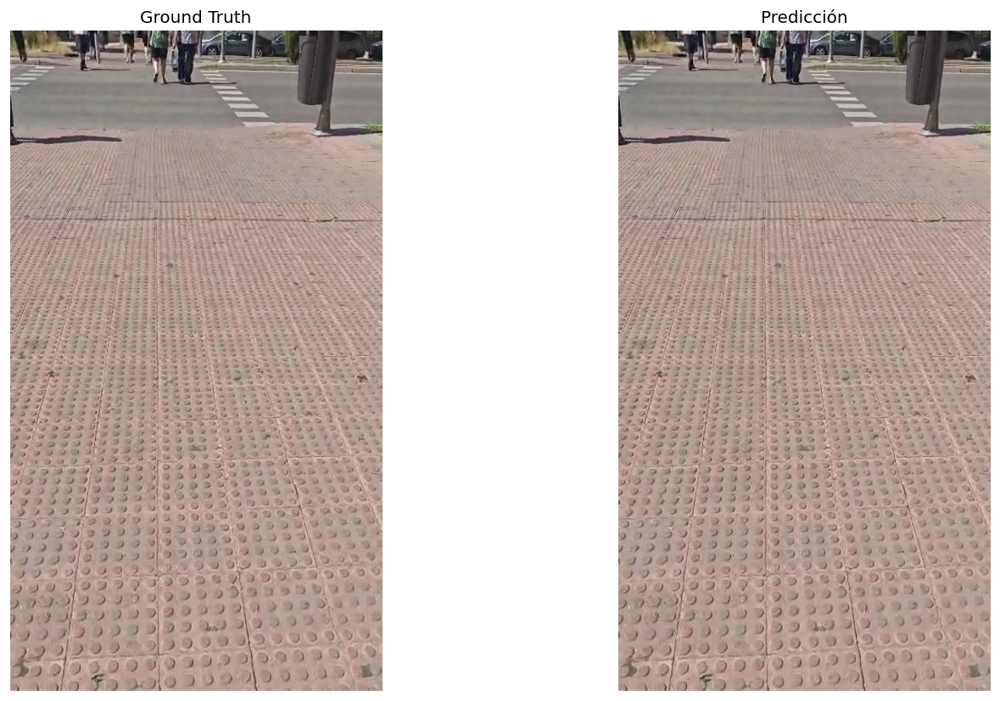


MEJOR ÉPOCA
epoch                    14.000000
time                    635.592000
train/box_loss            1.040330
train/cls_loss            0.444660
train/dfl_loss            0.001170
metrics/precision(B)      0.879850
metrics/recall(B)         0.882580
metrics/mAP50(B)          0.938850
metrics/mAP50-95(B)       0.655250
val/box_loss              1.107120
val/cls_loss              0.599200
val/dfl_loss              0.001890
lr/pg0                    0.000284
lr/pg1                    0.000284
lr/pg2                    0.000284
Name: 13, dtype: float64


mAP50      : 0.939
mAP50-95   : 0.655
Precision  : 0.880
Recall     : 0.883


In [5]:
# ============================================================
# ANÁLISIS DEL ENTRENAMIENTO YOLO26
# ============================================================

%matplotlib inline

import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd

from ultralytics import YOLO

# ------------------------------------------------------------
# CONFIGURACIÓN
# ------------------------------------------------------------

RUN_DIR = Path("/home/jgaldeano/tfm/results/yolo/yolo26m_v1-5")

MODEL_PATH = RUN_DIR / "weights" / "best.pt"

VAL_IMAGES = Path("/home/jgaldeano/tfm/data/datasets/yolo/images/val")
VAL_LABELS = Path("/home/jgaldeano/tfm/data/datasets/yolo/labels/val")

N_IMAGES = 8

plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["figure.dpi"] = 120


# ============================================================
# 1. MÉTRICAS DEL ENTRENAMIENTO
# ============================================================

results_csv = RUN_DIR / "results.csv"

df = pd.read_csv(results_csv)

print("\n============================")
print("RESULTADOS DEL ENTRENAMIENTO")
print("============================\n")

display(df)


# ============================================================
# 2. CURVAS DE ENTRENAMIENTO
# ============================================================

fig, ax = plt.subplots(figsize=(12,5))

ax.plot(df["epoch"], df["train/box_loss"], label="Box Loss")
ax.plot(df["epoch"], df["train/cls_loss"], label="Cls Loss")

if "train/dfl_loss" in df.columns:
    ax.plot(df["epoch"], df["train/dfl_loss"], label="DFL Loss")

ax.set_title("Training Loss")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.show()


# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(12,5))

ax.plot(df["epoch"], df["metrics/mAP50(B)"], label="mAP50")
ax.plot(df["epoch"], df["metrics/mAP50-95(B)"], label="mAP50-95")
ax.plot(df["epoch"], df["metrics/precision(B)"], label="Precision")
ax.plot(df["epoch"], df["metrics/recall(B)"], label="Recall")

ax.set_title("Validation Metrics")
ax.set_xlabel("Epoch")
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.show()


# ============================================================
# 3. CARGAR MODELO
# ============================================================

model = YOLO(MODEL_PATH)


# ============================================================
# FUNCIONES AUXILIARES
# ============================================================

def draw_ground_truth(ax, image_path, label_path):

    image = cv2.cvtColor(cv2.imread(str(image_path)), cv2.COLOR_BGR2RGB)

    h, w = image.shape[:2]

    ax.imshow(image)
    ax.set_title("Ground Truth")
    ax.axis("off")

    if not label_path.exists():
        return

    with open(label_path) as f:

        for line in f.readlines():

            cls, xc, yc, bw, bh = map(float, line.split())

            x = (xc - bw/2) * w
            y = (yc - bh/2) * h

            bw *= w
            bh *= h

            rect = patches.Rectangle(
                (x,y),
                bw,
                bh,
                linewidth=2,
                edgecolor="lime",
                facecolor="none"
            )

            ax.add_patch(rect)


# ------------------------------------------------------------

def draw_prediction(ax, image_path):

    image = cv2.cvtColor(cv2.imread(str(image_path)), cv2.COLOR_BGR2RGB)

    results = model.predict(
        source=str(image_path),
        conf=0.25,
        verbose=False
    )

    ax.imshow(image)
    ax.set_title("Predicción")
    ax.axis("off")

    boxes = results[0].boxes

    if boxes is None:
        return

    for box in boxes:

        x1,y1,x2,y2 = box.xyxy[0].cpu().numpy()

        conf = float(box.conf)

        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )

        ax.add_patch(rect)

        ax.text(
            x1,
            y1-5,
            f"{conf:.2f}",
            color="red",
            fontsize=10,
            bbox=dict(facecolor="white", alpha=0.7)
        )


# ============================================================
# 4. EJEMPLOS ALEATORIOS
# ============================================================

images = list(VAL_IMAGES.glob("*.jpg"))

if len(images) == 0:
    images = list(VAL_IMAGES.glob("*.png"))

samples = random.sample(images, min(N_IMAGES, len(images)))

for image_path in samples:

    label_path = VAL_LABELS / f"{image_path.stem}.txt"

    fig, axes = plt.subplots(1,2,figsize=(14,7))

    draw_ground_truth(
        axes[0],
        image_path,
        label_path
    )

    draw_prediction(
        axes[1],
        image_path
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 5. RESUMEN FINAL
# ============================================================

best_epoch = df["metrics/mAP50-95(B)"].idxmax()

print("\n============================")
print("MEJOR ÉPOCA")
print("============================")

print(df.loc[best_epoch])

print("\n")

print(f"mAP50      : {df.loc[best_epoch,'metrics/mAP50(B)']:.3f}")
print(f"mAP50-95   : {df.loc[best_epoch,'metrics/mAP50-95(B)']:.3f}")
print(f"Precision  : {df.loc[best_epoch,'metrics/precision(B)']:.3f}")
print(f"Recall     : {df.loc[best_epoch,'metrics/recall(B)']:.3f}")

# TEST PRO

In [6]:
# ============================================================
# IMPORTS
# ============================================================

from pathlib import Path
import random
import time

import cv2
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from ultralytics import YOLO

# Mostrar todas las columnas del DataFrame
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
pd.set_option("display.precision", 4)

# ============================================================
# ESTILO DE LAS FIGURAS
# ============================================================

plt.style.use("ggplot")

plt.rcParams.update({

    "figure.figsize": (12,6),
    "figure.dpi": 120,

    "axes.titlesize": 18,
    "axes.titleweight": "bold",

    "axes.labelsize": 13,

    "xtick.labelsize": 11,
    "ytick.labelsize": 11,

    "legend.fontsize": 11,

    "grid.alpha": 0.3,

    "lines.linewidth": 3,
    "lines.markersize": 6
})

In [7]:
# ============================================================
# CONFIGURACIÓN DEL EXPERIMENTO
# ============================================================

RUN_DIR = Path("/home/jgaldeano/tfm/results/yolo/yolo26m_v1-5")

MODEL_PATH = RUN_DIR / "weights" / "best.pt"

RESULTS_CSV = RUN_DIR / "results.csv"

VAL_IMAGES = Path("/home/jgaldeano/tfm/data/datasets/yolo/images/val")

VAL_LABELS = Path("/home/jgaldeano/tfm/data/datasets/yolo/labels/val")

print("Modelo:")
print(MODEL_PATH)

print("\nResultados:")
print(RUN_DIR)

Modelo:
/home/jgaldeano/tfm/results/yolo/yolo26m_v1-5/weights/best.pt

Resultados:
/home/jgaldeano/tfm/results/yolo/yolo26m_v1-5


In [11]:
# ============================================================
# CARGAR RESULTADOS
# ============================================================

df = pd.read_csv(RESULTS_CSV)

print(f"Número de épocas entrenadas: {len(df)}")

display(df.head())

Número de épocas entrenadas: 15


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,46.1752,1.6330,9.1203,0.0019,0.6475,0.7524,0.7375,0.4352,1.2872,6.9393,0.0022,0.0007,0.0007,0.0007
1,2,88.9280,1.4867,4.3617,0.0017,0.8011,0.8180,0.8816,0.5390,1.3512,3.1493,0.0024,0.0012,0.0012,0.0012
2,3,133.6150,1.4069,2.1803,0.0015,0.8168,0.8463,0.8952,0.5799,1.2303,1.8899,0.0021,0.0017,0.0017,0.0017
3,4,179.5850,1.3535,1.4363,0.0015,0.8503,0.8282,0.9020,0.5670,1.3138,1.2522,0.0024,0.0016,0.0016,0.0016
4,5,228.4200,1.3355,1.0136,0.0015,0.8560,0.8436,0.9149,0.5883,1.2733,1.0010,0.0023,0.0015,0.0015,0.0015


In [10]:
# ============================================================
# DASHBOARD DEL ENTRENAMIENTO
# ============================================================

columnas = [

    "epoch",

    "train/box_loss",
    "train/cls_loss",
    "train/dfl_loss",

    "metrics/precision(B)",
    "metrics/recall(B)",

    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)"

]

dashboard = df[columnas].copy()

dashboard = dashboard.rename(columns={

    "epoch":"Epoch",

    "train/box_loss":"Box Loss",
    "train/cls_loss":"Cls Loss",
    "train/dfl_loss":"DFL Loss",

    "metrics/precision(B)":"Precision",
    "metrics/recall(B)":"Recall",

    "metrics/mAP50(B)":"mAP50",
    "metrics/mAP50-95(B)":"mAP50-95"

})

display(dashboard.round(4))

,Epoch,Box Loss,Cls Loss,DFL Loss,Precision,Recall,mAP50,mAP50-95
0,1,1.6330,9.1203,0.0019,0.6475,0.7524,0.7375,0.4352
1,2,1.4867,4.3617,0.0017,0.8011,0.8180,0.8816,0.5390
2,3,1.4069,2.1803,0.0016,0.8168,0.8463,0.8952,0.5799
3,4,1.3535,1.4363,0.0015,0.8503,0.8282,0.9020,0.5670
4,5,1.3355,1.0136,0.0015,0.8560,0.8436,0.9149,0.5883
5,6,1.2360,0.9478,0.0015,0.8370,0.8288,0.8962,0.5419
6,7,1.2728,0.7397,0.0016,0.8480,0.8352,0.9077,0.5748
7,8,1.1986,0.6560,0.0014,0.8539,0.8317,0.9162,0.5858
8,9,1.1659,0.5933,0.0014,0.8632,0.8611,0.9330,0.6276
9,10,1.1280,0.5519,0.0013,0.8692,0.8806,0.9310,0.6050


In [12]:
# ============================================================
# RESUMEN DEL MODELO
# ============================================================

best_epoch = df["metrics/mAP50-95(B)"].idxmax()

best = df.loc[best_epoch]

print("="*45)
print("MEJOR ÉPOCA")
print("="*45)

print(f"Epoch          : {int(best['epoch'])}")

print()

print(f"Precision      : {best['metrics/precision(B)']:.4f}")
print(f"Recall         : {best['metrics/recall(B)']:.4f}")

print()

print(f"mAP@50         : {best['metrics/mAP50(B)']:.4f}")
print(f"mAP@50-95      : {best['metrics/mAP50-95(B)']:.4f}")

print()

print(f"Box Loss       : {best['train/box_loss']:.4f}")
print(f"Cls Loss       : {best['train/cls_loss']:.4f}")
print(f"DFL Loss       : {best['train/dfl_loss']:.4f}")

MEJOR ÉPOCA
Epoch          : 14

Precision      : 0.8799
Recall         : 0.8826

mAP@50         : 0.9388
mAP@50-95      : 0.6552

Box Loss       : 1.0403
Cls Loss       : 0.4447
DFL Loss       : 0.0012


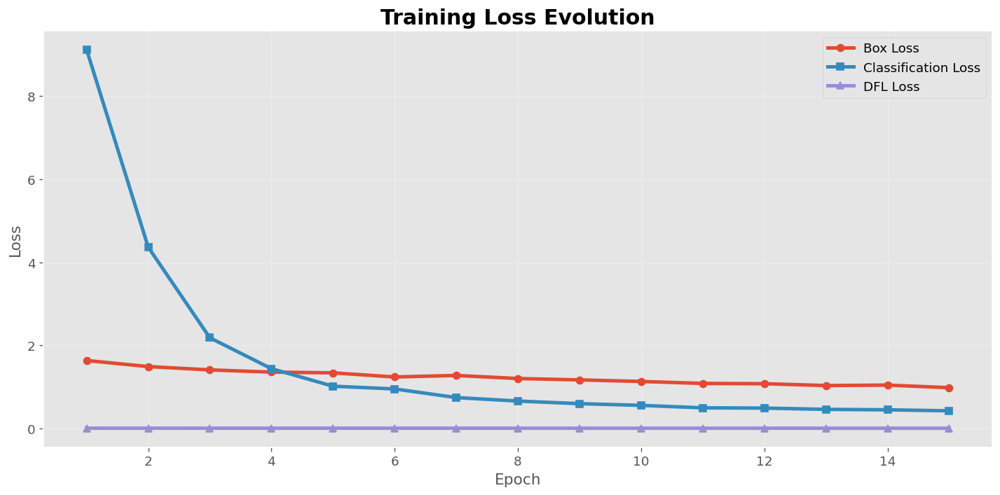

In [13]:
# ============================================================
# EVOLUCIÓN DE LAS FUNCIONES DE PÉRDIDA
# ============================================================

fig, ax = plt.subplots(figsize=(12,6))

ax.plot(
    df["epoch"],
    df["train/box_loss"],
    marker="o",
    label="Box Loss"
)

ax.plot(
    df["epoch"],
    df["train/cls_loss"],
    marker="s",
    label="Classification Loss"
)

ax.plot(
    df["epoch"],
    df["train/dfl_loss"],
    marker="^",
    label="DFL Loss"
)

ax.set_title("Training Loss Evolution")

ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")

ax.grid(True)

ax.legend()

plt.tight_layout()
plt.show()

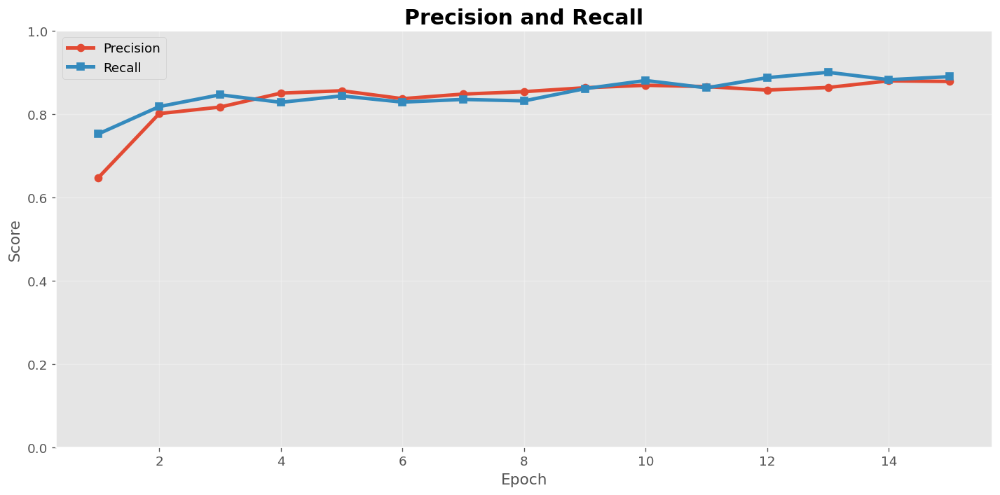

In [14]:
# ============================================================
# PRECISION Y RECALL
# ============================================================

fig, ax = plt.subplots(figsize=(12,6))

ax.plot(
    df["epoch"],
    df["metrics/precision(B)"],
    marker="o",
    label="Precision"
)

ax.plot(
    df["epoch"],
    df["metrics/recall(B)"],
    marker="s",
    label="Recall"
)

ax.set_ylim(0,1)

ax.set_title("Precision and Recall")

ax.set_xlabel("Epoch")
ax.set_ylabel("Score")

ax.legend()

ax.grid(True)

plt.tight_layout()
plt.show()

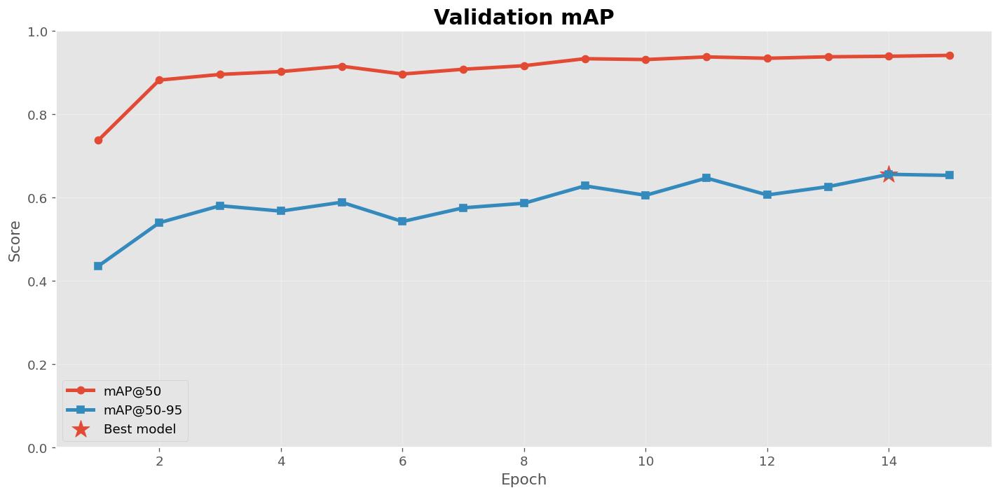

In [15]:
# ============================================================
# mAP
# ============================================================

fig, ax = plt.subplots(figsize=(12,6))

ax.plot(
    df["epoch"],
    df["metrics/mAP50(B)"],
    marker="o",
    label="mAP@50"
)

ax.plot(
    df["epoch"],
    df["metrics/mAP50-95(B)"],
    marker="s",
    label="mAP@50-95"
)

best = df["metrics/mAP50-95(B)"].idxmax()

ax.scatter(
    df.loc[best,"epoch"],
    df.loc[best,"metrics/mAP50-95(B)"],
    s=250,
    marker="*",
    label="Best model"
)

ax.set_ylim(0,1)

ax.set_title("Validation mAP")

ax.set_xlabel("Epoch")
ax.set_ylabel("Score")

ax.legend()

ax.grid(True)

plt.tight_layout()
plt.show()

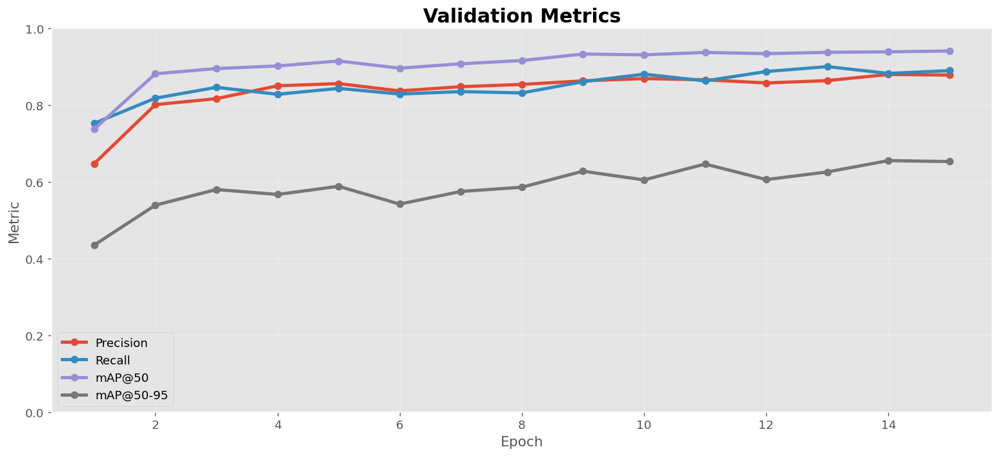

In [16]:
# ============================================================
# MÉTRICAS DE VALIDACIÓN
# ============================================================

fig, ax = plt.subplots(figsize=(13,6))

metricas = {

    "Precision":"metrics/precision(B)",

    "Recall":"metrics/recall(B)",

    "mAP@50":"metrics/mAP50(B)",

    "mAP@50-95":"metrics/mAP50-95(B)"

}

for nombre,columna in metricas.items():

    ax.plot(
        df["epoch"],
        df[columna],
        marker="o",
        label=nombre
    )

ax.set_ylim(0,1)

ax.set_title("Validation Metrics")

ax.set_xlabel("Epoch")

ax.set_ylabel("Metric")

ax.legend()

ax.grid(True)

plt.tight_layout()

plt.show()

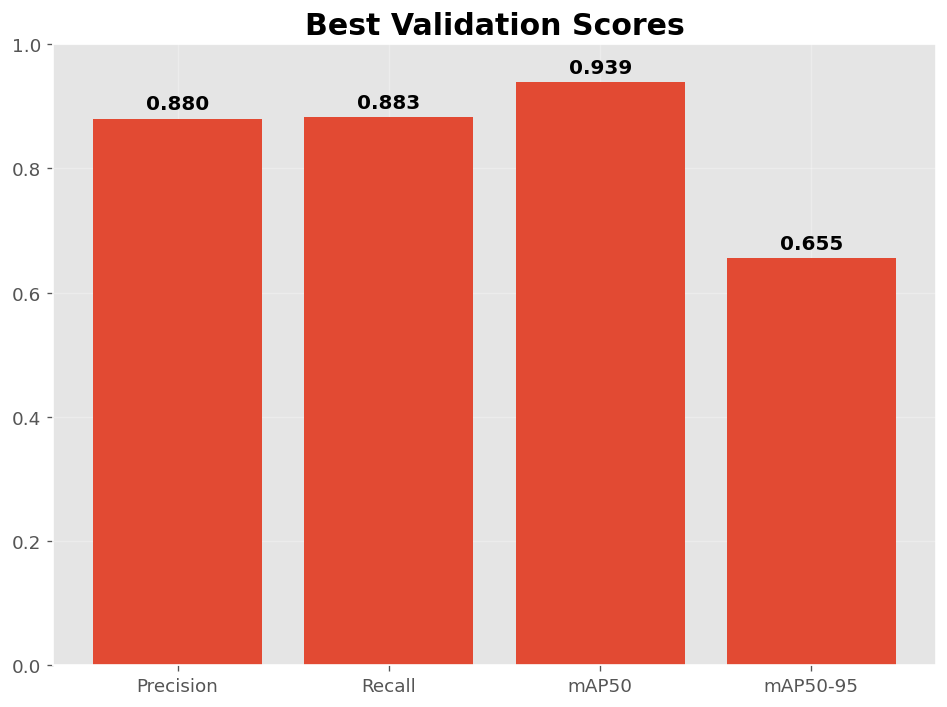

In [17]:
# ============================================================
# MEJOR MODELO
# ============================================================

best = df.loc[df["metrics/mAP50-95(B)"].idxmax()]

metricas = {

    "Precision":best["metrics/precision(B)"],

    "Recall":best["metrics/recall(B)"],

    "mAP50":best["metrics/mAP50(B)"],

    "mAP50-95":best["metrics/mAP50-95(B)"]

}

fig, ax = plt.subplots(figsize=(8,6))

bars = ax.bar(
    metricas.keys(),
    metricas.values()
)

ax.set_ylim(0,1)

ax.set_title("Best Validation Scores")

for bar in bars:

    altura = bar.get_height()

    ax.text(

        bar.get_x()+bar.get_width()/2,

        altura+0.015,

        f"{altura:.3f}",

        ha="center",

        fontsize=12,

        weight="bold"

    )

plt.tight_layout()

plt.show()

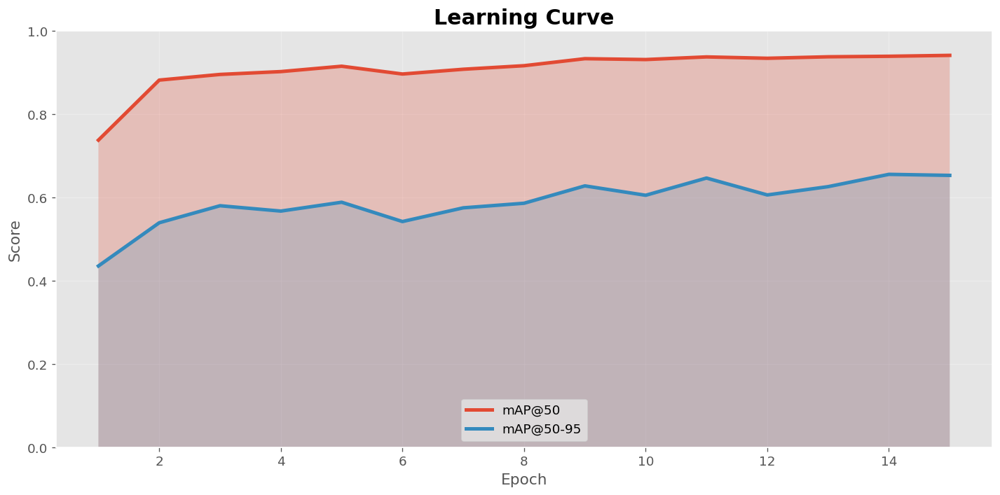

In [18]:
# ============================================================
# EVOLUCIÓN DEL APRENDIZAJE
# ============================================================

fig, ax = plt.subplots(figsize=(12,6))

ax.fill_between(
    df["epoch"],
    df["metrics/mAP50(B)"],
    alpha=0.25
)

ax.plot(
    df["epoch"],
    df["metrics/mAP50(B)"],
    linewidth=3,
    label="mAP@50"
)

ax.fill_between(
    df["epoch"],
    df["metrics/mAP50-95(B)"],
    alpha=0.20
)

ax.plot(
    df["epoch"],
    df["metrics/mAP50-95(B)"],
    linewidth=3,
    label="mAP@50-95"
)

ax.set_ylim(0,1)

ax.set_xlabel("Epoch")

ax.set_ylabel("Score")

ax.set_title("Learning Curve")

ax.legend()

ax.grid(True)

plt.tight_layout()

plt.show()

In [19]:
import pandas as pd
from pathlib import Path

# =========================
# Cargar resultados
# =========================

results_csv = RUN_DIR / "results.csv"

df = pd.read_csv(results_csv)

# Renombrar columnas para mayor claridad
df = df.rename(columns={
    "train/box_loss": "Train Box Loss",
    "train/cls_loss": "Train Cls Loss",
    "train/dfl_loss": "Train DFL Loss",

    "val/box_loss": "Val Box Loss",
    "val/cls_loss": "Val Cls Loss",
    "val/dfl_loss": "Val DFL Loss",

    "metrics/precision(B)": "Precision",
    "metrics/recall(B)": "Recall",
    "metrics/mAP50(B)": "mAP@50",
    "metrics/mAP50-95(B)": "mAP@50-95",

    "lr/pg0": "LR pg0",
    "lr/pg1": "LR pg1",
    "lr/pg2": "LR pg2"
})

display(df.head())

print(f"\nNúmero de épocas: {len(df)}")

,epoch,time,Train Box Loss,Train Cls Loss,Train DFL Loss,Precision,Recall,mAP@50,mAP@50-95,Val Box Loss,Val Cls Loss,Val DFL Loss,LR pg0,LR pg1,LR pg2
0,1,46.1752,1.6330,9.1203,0.0019,0.6475,0.7524,0.7375,0.4352,1.2872,6.9393,0.0022,0.0007,0.0007,0.0007
1,2,88.9280,1.4867,4.3617,0.0017,0.8011,0.8180,0.8816,0.5390,1.3512,3.1493,0.0024,0.0012,0.0012,0.0012
2,3,133.6150,1.4069,2.1803,0.0015,0.8168,0.8463,0.8952,0.5799,1.2303,1.8899,0.0021,0.0017,0.0017,0.0017
3,4,179.5850,1.3535,1.4363,0.0015,0.8503,0.8282,0.9020,0.5670,1.3138,1.2522,0.0024,0.0016,0.0016,0.0016
4,5,228.4200,1.3355,1.0136,0.0015,0.8560,0.8436,0.9149,0.5883,1.2733,1.0010,0.0023,0.0015,0.0015,0.0015



Número de épocas: 15


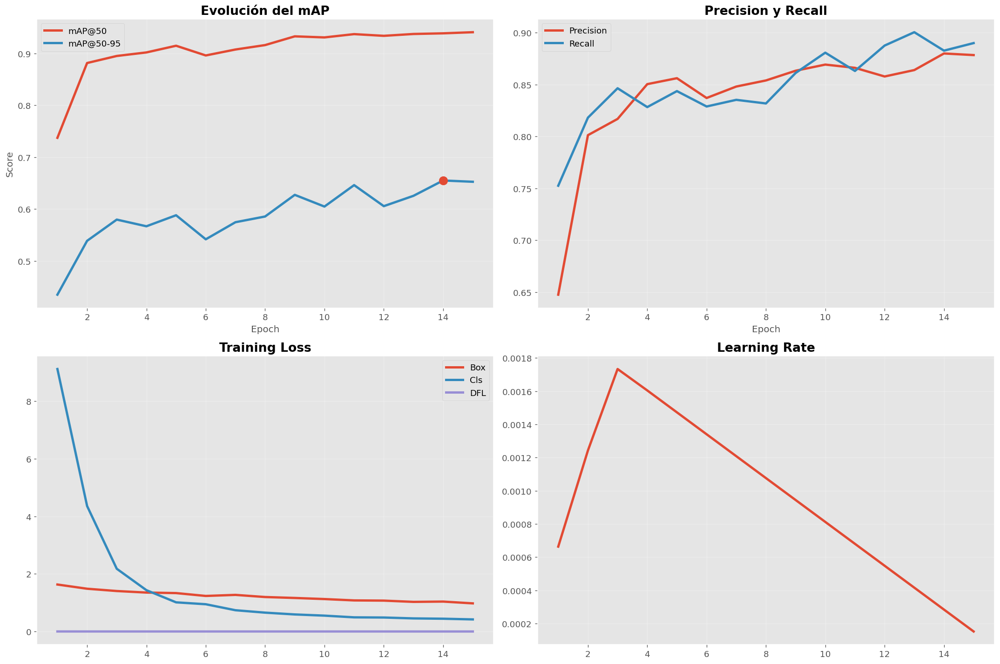

In [20]:
import matplotlib.pyplot as plt

plt.style.use("ggplot")

fig, axs = plt.subplots(2, 2, figsize=(18, 12))

# ===================================================
# mAP
# ===================================================

axs[0,0].plot(df["epoch"], df["mAP@50"], lw=3, label="mAP@50")
axs[0,0].plot(df["epoch"], df["mAP@50-95"], lw=3, label="mAP@50-95")

best_epoch = df["mAP@50-95"].idxmax()

axs[0,0].scatter(
    df.loc[best_epoch, "epoch"],
    df.loc[best_epoch, "mAP@50-95"],
    s=120,
    zorder=5
)

axs[0,0].set_title("Evolución del mAP", fontsize=16)
axs[0,0].set_xlabel("Epoch")
axs[0,0].set_ylabel("Score")
axs[0,0].legend()

# ===================================================
# Precision Recall
# ===================================================

axs[0,1].plot(df["epoch"], df["Precision"], lw=3, label="Precision")
axs[0,1].plot(df["epoch"], df["Recall"], lw=3, label="Recall")

axs[0,1].set_title("Precision y Recall", fontsize=16)
axs[0,1].set_xlabel("Epoch")
axs[0,1].legend()

# ===================================================
# Loss
# ===================================================

axs[1,0].plot(df["epoch"], df["Train Box Loss"], lw=3, label="Box")
axs[1,0].plot(df["epoch"], df["Train Cls Loss"], lw=3, label="Cls")
axs[1,0].plot(df["epoch"], df["Train DFL Loss"], lw=3, label="DFL")

axs[1,0].set_title("Training Loss", fontsize=16)
axs[1,0].legend()

# ===================================================
# Learning Rate
# ===================================================

axs[1,1].plot(df["epoch"], df["LR pg0"], lw=3)
axs[1,1].set_title("Learning Rate", fontsize=16)

for ax in axs.ravel():
    ax.grid(alpha=.3)

plt.tight_layout()
plt.show()

In [21]:
best = df.loc[df["mAP@50-95"].idxmax()]

summary = pd.DataFrame({
    "Métrica":[
        "Mejor Epoch",
        "Precision",
        "Recall",
        "mAP@50",
        "mAP@50-95",
        "Train Box Loss",
        "Train Cls Loss"
    ],
    "Valor":[
        int(best["epoch"]),
        best["Precision"],
        best["Recall"],
        best["mAP@50"],
        best["mAP@50-95"],
        best["Train Box Loss"],
        best["Train Cls Loss"]
    ]
})

summary

,Métrica,Valor
0,Mejor Epoch,14.0000
1,Precision,0.8799
2,Recall,0.8826
3,mAP@50,0.9388
4,mAP@50-95,0.6552
5,Train Box Loss,1.0403
6,Train Cls Loss,0.4447


In [2]:
from pathlib import Path

# =====================================
# Rutas del proyecto
# =====================================

PROJECT_DIR = Path("/home/jgaldeano/tfm")

DATASET_DIR = PROJECT_DIR / "data" / "datasets" / "yolo"

RUN_DIR = PROJECT_DIR / "results" / "yolo" / "yolo26m_v1-5"

In [24]:
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from ultralytics import YOLO

# -------------------------------
# Cargar mejor modelo
# -------------------------------

best_model = YOLO(RUN_DIR / "weights" / "best.pt")

# -------------------------------
# Carpetas
# -------------------------------

VAL_IMAGES = DATASET_DIR / "images" / "val"
VAL_LABELS = DATASET_DIR / "labels" / "val"

image_list = sorted(list(VAL_IMAGES.glob("*")))

print(f"Imágenes de validación: {len(image_list)}")


# ------------------------------------------------------
# Leer etiquetas YOLO
# ------------------------------------------------------

def load_labels(label_path):

    boxes = []

    if not label_path.exists():
        return boxes

    with open(label_path) as f:
        for line in f.readlines():

            cls, xc, yc, w, h = map(float, line.split())

            boxes.append({
                "cls": int(cls),
                "xc": xc,
                "yc": yc,
                "w": w,
                "h": h
            })

    return boxes


# ------------------------------------------------------
# Dibujar Ground Truth
# ------------------------------------------------------

def draw_ground_truth(ax, image, labels):

    h, w = image.shape[:2]

    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    for box in labels:

        bw = box["w"] * w
        bh = box["h"] * h

        x = box["xc"] * w - bw / 2
        y = box["yc"] * h - bh / 2

        rect = patches.Rectangle(
            (x, y),
            bw,
            bh,
            linewidth=2.5,
            edgecolor="lime",
            facecolor="none"
        )

        ax.add_patch(rect)

    ax.set_title("Ground Truth", fontsize=14)
    ax.axis("off")


# ------------------------------------------------------
# Dibujar Predicciones
# ------------------------------------------------------

def draw_prediction(ax, image, result):

    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    for box in result.boxes:

        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()

        conf = float(box.conf)

        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2.5,
            edgecolor="red",
            facecolor="none"
        )

        ax.add_patch(rect)

        ax.text(
            x1,
            max(5, y1 - 8),
            f"{conf:.2f}",
            fontsize=10,
            color="white",
            bbox=dict(facecolor="red", alpha=.8, pad=2)
        )

    ax.set_title("Predicción YOLO", fontsize=14)
    ax.axis("off")

Imágenes de validación: 738


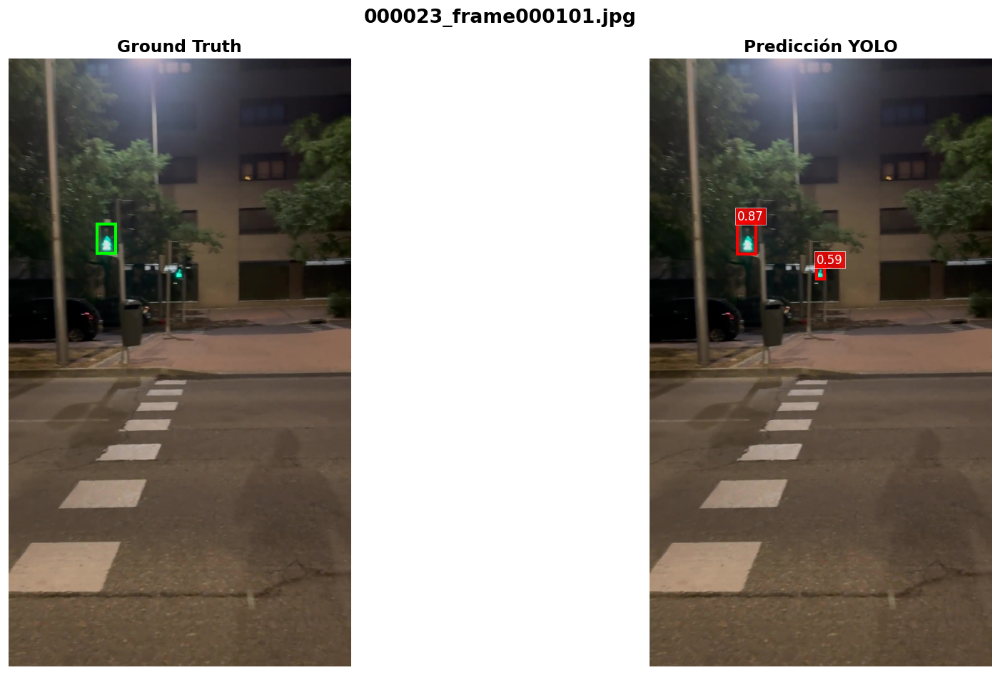

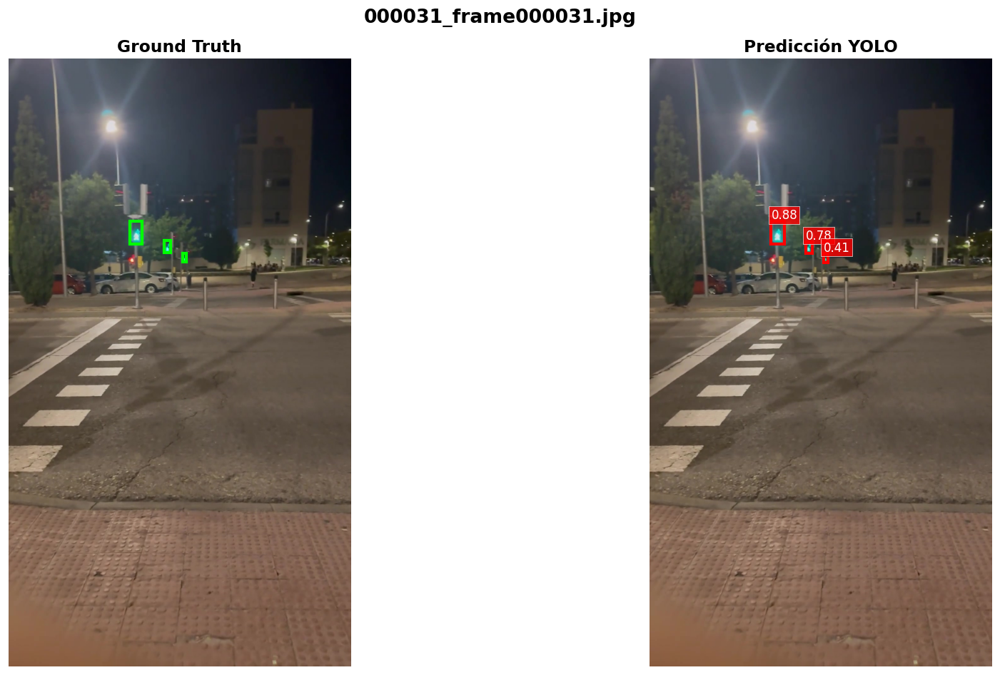

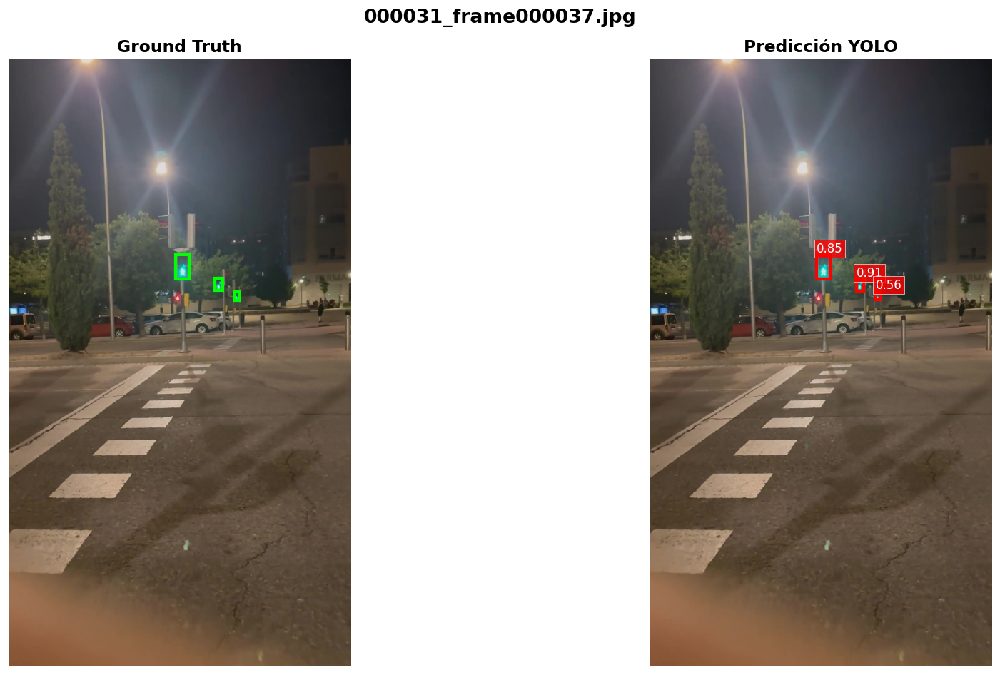

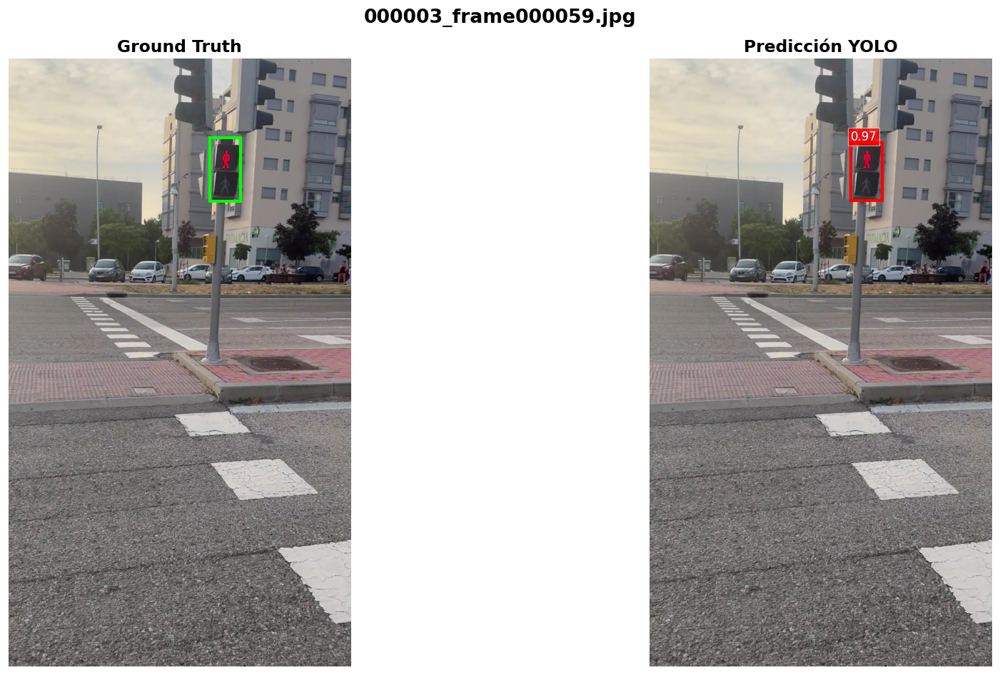

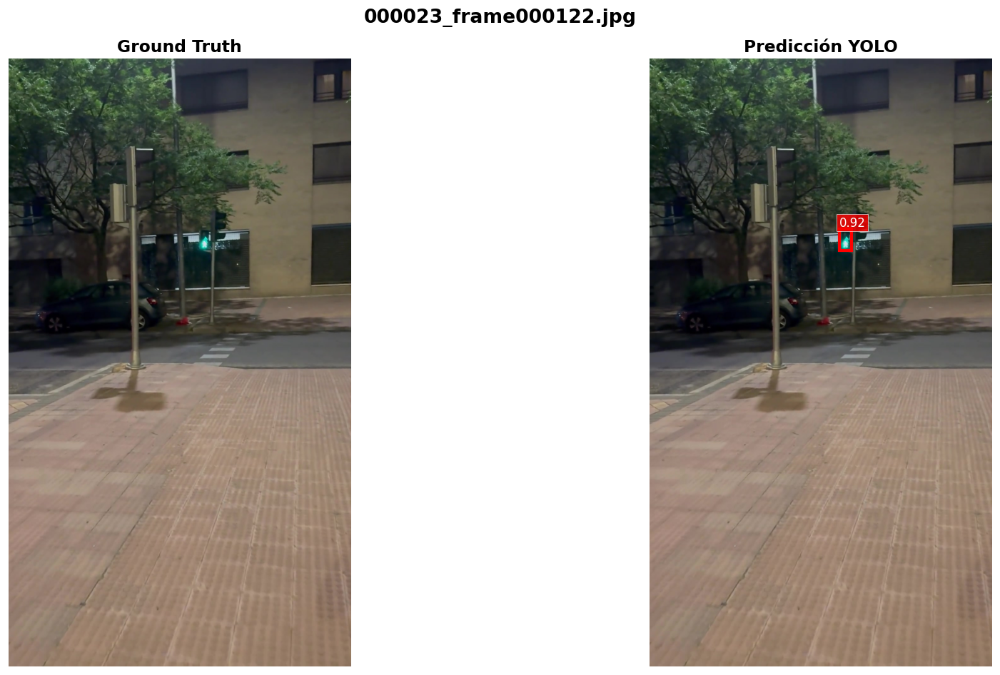

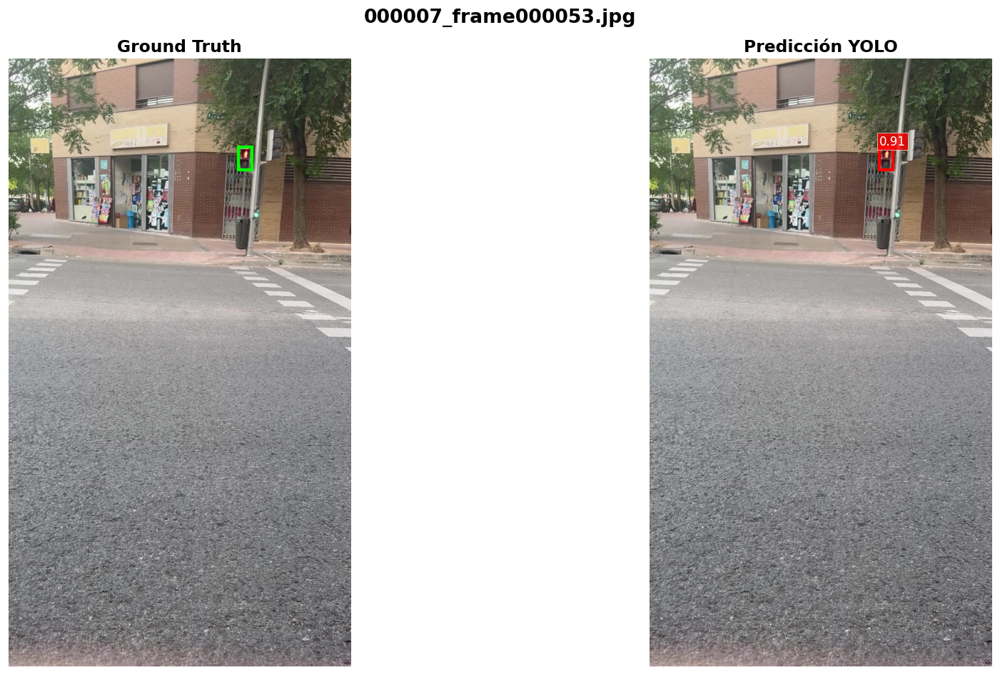

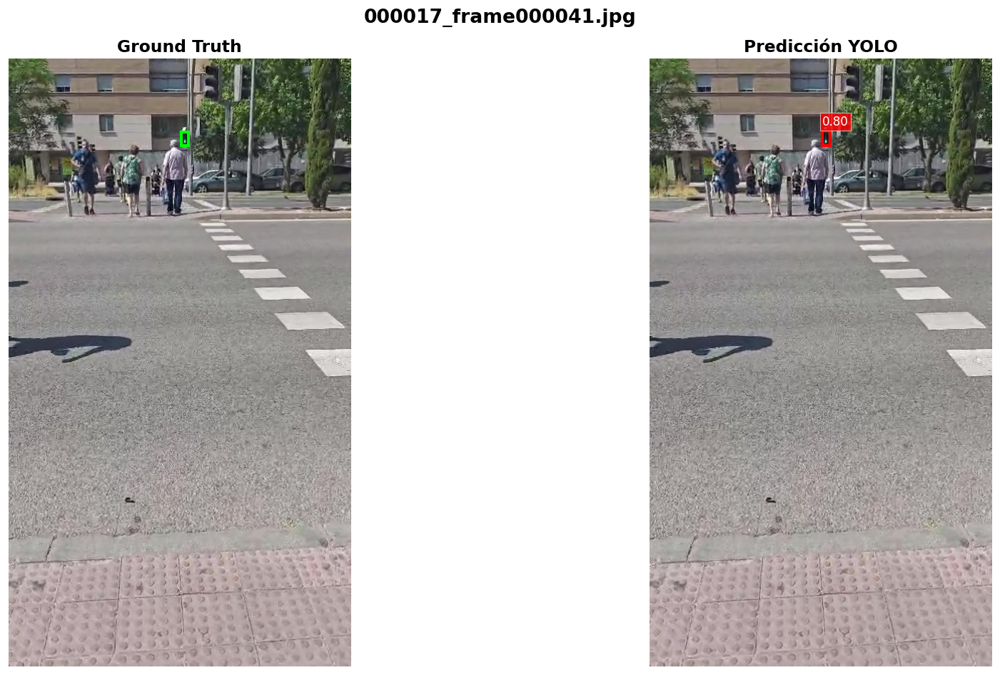

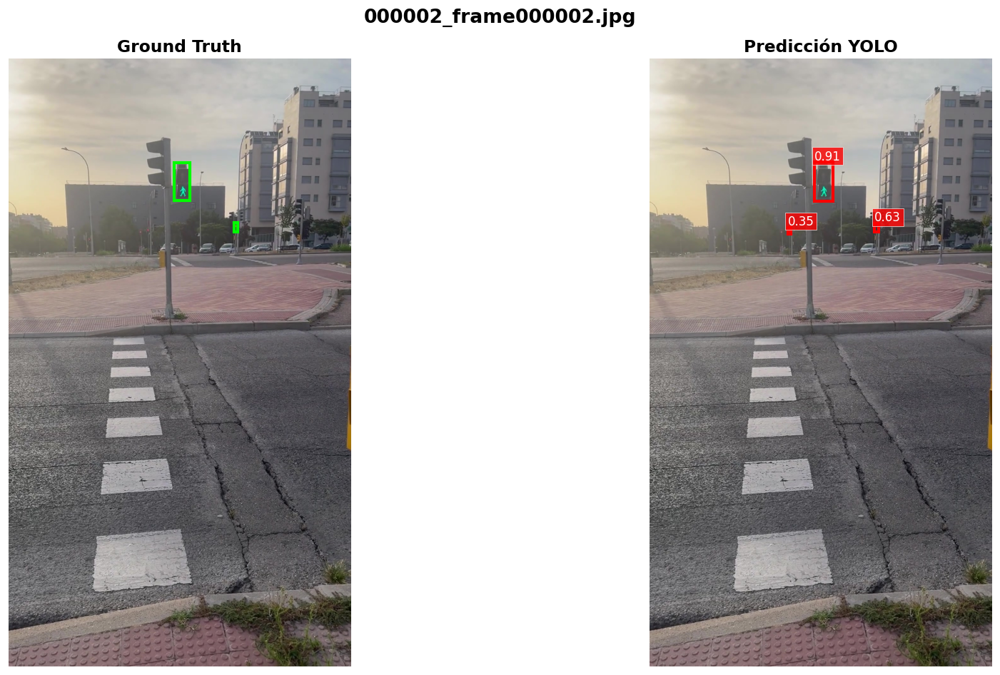

In [27]:
N_IMAGES = 8

samples = random.sample(image_list, N_IMAGES)

for img_path in samples:

    image = cv2.imread(str(img_path))

    label_path = VAL_LABELS / f"{img_path.stem}.txt"

    labels = load_labels(label_path)

    prediction = best_model.predict(
        source=image,
        imgsz=960,
        conf=0.25,
        verbose=False
    )[0]

    fig, ax = plt.subplots(
        1,
        2,
        figsize=(18,8)
    )

    draw_ground_truth(
        ax[0],
        image,
        labels
    )

    draw_prediction(
        ax[1],
        image,
        prediction
    )

    fig.suptitle(
        img_path.name,
        fontsize=16,
        fontweight="bold"
    )

    plt.tight_layout()

    plt.show()

In [ ]:
import cv2
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from pathlib import Path
from ultralytics import YOLO
import numpy as np


# =====================================================
# CONFIGURACIÓN
# =====================================================

VIDEO_NAME = "000003"

IMAGE_DIR = DATASET_DIR / "images" / "val"
LABEL_DIR = DATASET_DIR / "labels" / "val"

OUTPUT_GIF = RUN_DIR / f"{VIDEO_NAME}_GT_vs_YOLO.gif"

MODEL_PATH = RUN_DIR / "weights" / "best.pt"


# coger un frame de cada N
FRAME_STEP = 5

# máximo número de imágenes del gif
MAX_FRAMES = 100

CONF = 0.25

GIF_FPS = 8


# =====================================================
# CARGAR MODELO
# =====================================================

model = YOLO(MODEL_PATH)


# =====================================================
# BUSCAR FRAMES
# =====================================================

frame_paths = sorted(
    IMAGE_DIR.glob(f"{VIDEO_NAME}_*.jpg")
)


if len(frame_paths) == 0:
    raise ValueError(
        f"No se encontraron frames para {VIDEO_NAME}"
    )


print(
    f"Frames encontrados: {len(frame_paths)}"
)



# =====================================================
# LEER LABEL YOLO
# =====================================================

def read_yolo_labels(label_path, shape):

    boxes = []

    h, w = shape[:2]


    if not label_path.exists():
        return boxes


    with open(label_path) as f:

        for line in f:

            values = line.strip().split()

            if len(values) != 5:
                continue


            cls, xc, yc, bw, bh = map(
                float,
                values
            )


            x1 = int(
                (xc - bw/2) * w
            )

            y1 = int(
                (yc - bh/2) * h
            )

            x2 = int(
                (xc + bw/2) * w
            )

            y2 = int(
                (yc + bh/2) * h
            )


            boxes.append(
                (x1,y1,x2,y2)
            )


    return boxes



# =====================================================
# DIBUJAR GROUND TRUTH
# =====================================================

def draw_gt(ax, frame, boxes):


    ax.imshow(
        cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
    )


    for x1,y1,x2,y2 in boxes:


        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=3,
            edgecolor="lime",
            facecolor="none"
        )

        ax.add_patch(rect)


    ax.set_title(
        "Ground Truth",
        fontsize=16,
        fontweight="bold"
    )

    ax.axis("off")



# =====================================================
# DIBUJAR YOLO
# =====================================================

def draw_prediction(ax, frame, result):


    ax.imshow(
        cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
    )


    for box in result.boxes:


        x1,y1,x2,y2 = (
            box.xyxy[0]
            .cpu()
            .numpy()
        )


        conf = float(box.conf)


        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=3,
            edgecolor="red",
            facecolor="none"
        )


        ax.add_patch(rect)


        ax.text(
            x1,
            max(10,y1-5),
            f"{conf:.2f}",
            fontsize=10,
            color="white",
            bbox=dict(
                facecolor="red",
                alpha=0.8
            )
        )


    ax.set_title(
        "YOLO26 Prediction",
        fontsize=16,
        fontweight="bold"
    )

    ax.axis("off")



# =====================================================
# CREAR GIF
# =====================================================


gif_frames = []


for idx, img_path in enumerate(frame_paths):


    if idx % FRAME_STEP != 0:
        continue


    if len(gif_frames) >= MAX_FRAMES:
        break



    # cargar imagen

    frame = cv2.imread(
        str(img_path)
    )


    if frame is None:
        continue



    # ---------------------------
    # Ground Truth
    # ---------------------------

    label_path = (
        LABEL_DIR /
        f"{img_path.stem}.txt"
    )


    gt_boxes = read_yolo_labels(
        label_path,
        frame.shape
    )



    # ---------------------------
    # Predicción YOLO
    # ---------------------------

    prediction = model.predict(
        frame,
        imgsz=960,
        conf=CONF,
        verbose=False
    )[0]



    # ---------------------------
    # Crear figura
    # ---------------------------

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16,8)
    )


    draw_gt(
        axes[0],
        frame,
        gt_boxes
    )


    draw_prediction(
        axes[1],
        frame,
        prediction
    )


    fig.suptitle(
        f"{VIDEO_NAME} - Frame {idx}",
        fontsize=18,
        fontweight="bold"
    )


    plt.tight_layout()



    # convertir figura a imagen

    fig.canvas.draw()


    img = np.asarray(
        fig.canvas.buffer_rgba()
    )


    img = img[:,:,:3]


    gif_frames.append(img)


    plt.close(fig)



print(
    f"Frames usados en GIF: {len(gif_frames)}"
)



# =====================================================
# GUARDAR GIF
# =====================================================

if len(gif_frames) == 0:

    raise ValueError(
        "No se generaron frames para el GIF"
    )


imageio.mimsave(
    OUTPUT_GIF,
    gif_frames,
    fps=GIF_FPS,
    loop=0
)


print("\nGIF creado correctamente:")
print(OUTPUT_GIF)

Modelo cargado correctamente


ValueError: invalid literal for int() with base 10: 'frame000028'

In [5]:
import cv2
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from pathlib import Path
from ultralytics import YOLO
import numpy as np


# =====================================================
# CONFIGURACIÓN
# =====================================================

VIDEO_NAME = "000027"


IMAGE_DIR = DATASET_DIR / "images" / "val"
LABEL_DIR = DATASET_DIR / "labels" / "val"


OUTPUT_GIF = RUN_DIR / f"{VIDEO_NAME}_GT_vs_YOLO.gif"


MODEL_PATH = RUN_DIR / "weights" / "best.pt"


CONF = 0.25

IMG_SIZE = 960

GIF_FPS = 6



# =====================================================
# CARGAR MODELO
# =====================================================

model = YOLO(MODEL_PATH)

print("Modelo cargado correctamente")



# =====================================================
# BUSCAR FRAMES DEL VIDEO
# =====================================================

frame_paths = sorted(
    IMAGE_DIR.glob(f"{VIDEO_NAME}_*.jpg"),
    key=lambda x: int(
        x.stem.split("frame")[-1]
    )
)


if len(frame_paths) == 0:

    raise ValueError(
        f"No se encontraron frames para {VIDEO_NAME}"
    )


print(
    f"Frames encontrados: {len(frame_paths)}"
)



# =====================================================
# LEER LABELS YOLO
# =====================================================

def read_yolo_labels(label_path, shape):

    boxes = []

    h, w = shape[:2]


    if not label_path.exists():

        return boxes



    with open(label_path) as f:

        for line in f:

            values = line.strip().split()


            if len(values) != 5:

                continue



            cls, xc, yc, bw, bh = map(
                float,
                values
            )


            x1 = int(
                (xc - bw/2) * w
            )

            y1 = int(
                (yc - bh/2) * h
            )

            x2 = int(
                (xc + bw/2) * w
            )

            y2 = int(
                (yc + bh/2) * h
            )


            boxes.append(
                (x1,y1,x2,y2)
            )


    return boxes




# =====================================================
# DIBUJAR GROUND TRUTH
# =====================================================

def draw_gt(ax, frame, boxes):


    ax.imshow(
        cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
    )


    for x1,y1,x2,y2 in boxes:


        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=3,
            edgecolor="lime",
            facecolor="none"
        )


        ax.add_patch(rect)



    ax.set_title(
        "Ground Truth",
        fontsize=16,
        fontweight="bold"
    )


    ax.axis("off")




# =====================================================
# DIBUJAR PREDICCIÓN YOLO
# =====================================================

def draw_prediction(ax, frame, result):


    ax.imshow(
        cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
    )



    for box in result.boxes:


        x1,y1,x2,y2 = (
            box.xyxy[0]
            .cpu()
            .numpy()
        )


        conf = float(
            box.conf[0]
        )



        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=3,
            edgecolor="red",
            facecolor="none"
        )


        ax.add_patch(rect)



        ax.text(
            x1,
            max(15,y1-5),
            f"{conf:.2f}",
            fontsize=10,
            color="white",
            bbox=dict(
                facecolor="red",
                alpha=0.8
            )
        )



    ax.set_title(
        "YOLO26 Prediction",
        fontsize=16,
        fontweight="bold"
    )


    ax.axis("off")




# =====================================================
# GENERAR GIF
# =====================================================

gif_frames = []


for idx, img_path in enumerate(frame_paths):


    print(
        f"Procesando frame {idx+1}/{len(frame_paths)}",
        end="\r"
    )


    # cargar imagen

    frame = cv2.imread(
        str(img_path)
    )


    if frame is None:

        continue



    # -------------------------
    # Ground Truth
    # -------------------------

    label_path = (
        LABEL_DIR /
        f"{img_path.stem}.txt"
    )


    gt_boxes = read_yolo_labels(
        label_path,
        frame.shape
    )



    # -------------------------
    # Predicción YOLO
    # -------------------------

    prediction = model.predict(
        frame,
        imgsz=IMG_SIZE,
        conf=CONF,
        verbose=False
    )[0]



    # -------------------------
    # Figura comparativa
    # -------------------------

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16,8)
    )



    draw_gt(
        axes[0],
        frame,
        gt_boxes
    )


    draw_prediction(
        axes[1],
        frame,
        prediction
    )



    fig.suptitle(
        f"{VIDEO_NAME} - Frame {idx}",
        fontsize=18,
        fontweight="bold"
    )



    plt.tight_layout()



    # convertir figura a imagen

    fig.canvas.draw()


    img = np.asarray(
        fig.canvas.buffer_rgba()
    )


    img = img[:,:,:3]



    # reducir tamaño

    img = cv2.resize(
        img,
        (1280,720)
    )


    gif_frames.append(
        img
    )



    plt.close(fig)



print(
    "\nFrames generados:",
    len(gif_frames)
)



# =====================================================
# GUARDAR GIF
# =====================================================

if len(gif_frames)==0:

    raise ValueError(
        "No se generaron frames"
    )



imageio.mimsave(
    OUTPUT_GIF,
    gif_frames,
    fps=GIF_FPS,
    loop=0
)



print("\nGIF creado correctamente:")
print(OUTPUT_GIF)

Modelo cargado correctamente
Frames encontrados: 67
Procesando frame 67/67
Frames generados: 67

GIF creado correctamente:
/home/jgaldeano/tfm/results/yolo/yolo26m_v1-5/000027_GT_vs_YOLO.gif


Export en mp4

In [4]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from pathlib import Path
from ultralytics import YOLO
import numpy as np


# =====================================================
# CONFIGURACIÓN
# =====================================================

VIDEO_NAME = "000027"


IMAGE_DIR = DATASET_DIR / "images" / "val"
LABEL_DIR = DATASET_DIR / "labels" / "val"


OUTPUT_MP4 = RUN_DIR / f"{VIDEO_NAME}_GT_vs_YOLO.mp4"


MODEL_PATH = RUN_DIR / "weights" / "best.pt"


CONF = 0.25

IMG_SIZE = 960

FPS = 6


OUTPUT_SIZE = (1280,720)



# =====================================================
# CARGAR MODELO
# =====================================================

model = YOLO(MODEL_PATH)

print("Modelo cargado correctamente")



# =====================================================
# BUSCAR FRAMES DEL VIDEO
# =====================================================

frame_paths = sorted(
    IMAGE_DIR.glob(f"{VIDEO_NAME}_*.jpg"),
    key=lambda x: int(
        x.stem.split("frame")[-1]
    )
)


if len(frame_paths) == 0:

    raise ValueError(
        f"No se encontraron frames para {VIDEO_NAME}"
    )


print(
    f"Frames encontrados: {len(frame_paths)}"
)



# =====================================================
# LEER LABELS YOLO
# =====================================================

def read_yolo_labels(label_path, shape):

    boxes = []

    h, w = shape[:2]


    if not label_path.exists():

        return boxes


    with open(label_path) as f:

        for line in f:

            values = line.strip().split()


            if len(values) != 5:
                continue


            cls, xc, yc, bw, bh = map(
                float,
                values
            )


            x1 = int((xc-bw/2)*w)
            y1 = int((yc-bh/2)*h)

            x2 = int((xc+bw/2)*w)
            y2 = int((yc+bh/2)*h)


            boxes.append(
                (x1,y1,x2,y2)
            )


    return boxes



# =====================================================
# DIBUJAR GROUND TRUTH
# =====================================================

def draw_gt(ax, frame, boxes):


    ax.imshow(
        cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
    )


    for x1,y1,x2,y2 in boxes:


        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=3,
            edgecolor="lime",
            facecolor="none"
        )


        ax.add_patch(rect)



    ax.set_title(
        "Ground Truth",
        fontsize=16,
        fontweight="bold"
    )


    ax.axis("off")



# =====================================================
# DIBUJAR PREDICCIÓN
# =====================================================

def draw_prediction(ax, frame, result):


    ax.imshow(
        cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )
    )



    for box in result.boxes:


        x1,y1,x2,y2 = (
            box.xyxy[0]
            .cpu()
            .numpy()
        )


        conf = float(
            box.conf[0]
        )


        rect = patches.Rectangle(
            (x1,y1),
            x2-x1,
            y2-y1,
            linewidth=3,
            edgecolor="red",
            facecolor="none"
        )


        ax.add_patch(rect)


        ax.text(
            x1,
            max(15,y1-5),
            f"{conf:.2f}",
            fontsize=10,
            color="white",
            bbox=dict(
                facecolor="red",
                alpha=0.8
            )
        )


    ax.set_title(
        "YOLO26 Prediction",
        fontsize=16,
        fontweight="bold"
    )


    ax.axis("off")



# =====================================================
# CREAR VIDEO WRITER
# =====================================================

fourcc = cv2.VideoWriter_fourcc(
    *"mp4v"
)


video_writer = cv2.VideoWriter(
    str(OUTPUT_MP4),
    fourcc,
    FPS,
    OUTPUT_SIZE
)



# =====================================================
# GENERAR VIDEO
# =====================================================

for idx, img_path in enumerate(frame_paths):


    print(
        f"Procesando frame {idx+1}/{len(frame_paths)}",
        end="\r"
    )



    frame = cv2.imread(
        str(img_path)
    )


    if frame is None:
        continue



    # -------------------------
    # Ground Truth
    # -------------------------

    label_path = (
        LABEL_DIR /
        f"{img_path.stem}.txt"
    )


    gt_boxes = read_yolo_labels(
        label_path,
        frame.shape
    )



    # -------------------------
    # Predicción YOLO
    # -------------------------

    prediction = model.predict(
        frame,
        imgsz=IMG_SIZE,
        conf=CONF,
        verbose=False
    )[0]



    # -------------------------
    # Crear figura
    # -------------------------

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16,8)
    )



    draw_gt(
        axes[0],
        frame,
        gt_boxes
    )


    draw_prediction(
        axes[1],
        frame,
        prediction
    )



    fig.suptitle(
        f"{VIDEO_NAME} - Frame {idx}",
        fontsize=18,
        fontweight="bold"
    )


    plt.tight_layout()



    # pasar matplotlib a numpy

    fig.canvas.draw()


    img = np.asarray(
        fig.canvas.buffer_rgba()
    )


    img = img[:,:,:3]



    # RGB -> BGR para OpenCV

    img = cv2.cvtColor(
        img,
        cv2.COLOR_RGB2BGR
    )


    img = cv2.resize(
        img,
        OUTPUT_SIZE
    )


    video_writer.write(
        img
    )


    plt.close(fig)



# =====================================================
# FINALIZAR VIDEO
# =====================================================

video_writer.release()


print("\n\nVideo creado correctamente:")
print(OUTPUT_MP4)

Modelo cargado correctamente
Frames encontrados: 67
Procesando frame 67/67

Video creado correctamente:
/home/jgaldeano/tfm/results/yolo/yolo26m_v1-5/000027_GT_vs_YOLO.mp4
